<font style="font-size:96px; font-weight:bolder; color:#0040a0"><img src="http://montage.ipac.caltech.edu/docs/M51_logo.png" alt="M" style="float: left; padding: 25px 30px 25px 0px;" /></font>

<i><b>Montage</b> Montage is an astronomical image toolkit with components for reprojection, background matching, coaddition and visualization of FITS files. It can be used as a set of command-line tools (Linux, OS X and Windows), C library calls (Linux and OS X) and as Python binary extension modules.

The Montage source is written in ANSI-C and code can be downloaded from GitHub ( https://github.com/Caltech-IPAC/Montage ). The Python package can be installed from PyPI ("</i>pip install MontagePy<i>"). The package has no external dependencies. See http://montage.ipac.caltech.edu/ for details on the design and applications of Montage.


# MontagePy.main modules: mDiffExec

The Montage modules are generally used as steps in a workflow to create a mosaic of a set of input images.  These steps are: determine the geometry of the mosaic on the sky, reproject the images to a common frame and spatial sampling; rectify the backgrounds to a common level, and coadd the images into a mosaic.  This page illustrates the use of one Montage module, mDiffExec, which takes the differences between a set of image pairs (usually image overlaps).

Visit <a href="Mosaic.ipynb">Building a Mosaic with Montage</a> to see how mDiffExec is used as part of a workflow to creage a mosaic (or the <a href="Mosaic_oneshot.ipynb"> one shot </a> version if you just want to see the commands).  See the complete list of Montage Notebooks <a href="http://montage.ipac.caltech.edu/MontageNotebooks">here</a>.


In [1]:
from MontagePy.main import mDiffExec, mViewer

help(mDiffExec)

Help on built-in function mDiffExec in module MontagePy.main:

mDiffExec(...)
    mDiffExec loops over a list of image overlaps, computing and saving the differences.
    
    Parameters
    ----------
    path : str
        Path to raw image directory.
    difffile : str
        Table file list of all image overlaps.
    template : str
        FITS header file used to define the desired output.
    diffdir : str, optional
        Directory for temporary difference files.
    noAreas : bool, optional
        Flag indicating there are no area images.
    debug : int, optional
        Debugging output flag.
    
    
    Returns
    -------
    status : int
        Return status (0: OK, 1:ERROR).
    msg : str
        Return message (for errors).
    count : int
        Total number of images.
    failed : int
        Count where difference failed.



## mDiffExec Example

mDiffExec is a general utility for creating a set of differences images.  It's most common use is in the process of evaluating overlap area in a set of images as part of background rectification.  That process consists of taking the output of the overlaps calculation (mOverlaps) and for each overlap pair doing the difference (mDiff), fitting it to determine offset between those two images (mFitplane).

There are two ways to do this in bulk.  We can either generate all the differences first, then fit them all or we can loop over the differences, generating and fitting that difference before moving on to the next.  This first approach uses more disks space as all the differences have to be stored in between steps.  The second can clean up as it goes.

Obviously the second approach is preferable unless you want to keep the differences (possibly for quality evaluation).

mDiffExec is part of the first approach.  It runs mFitplane on difference file from the input list and stores the result in a table.  This table will usually be handed to mBgModel to determine what corrections to make to each image to minimize background differences.

At this point in the processing, we already have a set of "like" images (same projection) and have made a list of all the overlaps (normally using mOverlaps).  mDiffExec loops over this list and generates all the difference images in a subdirectory:

In [2]:
rtn = mDiffExec('M17/projected', 
                'M17/diffs.tbl', 
                'M17/M17.hdr', 
                'work/M17/diffs')
print(rtn)

{'status': '0', 'count': 128, 'failed': 0}


The list of overlaps, as generated by mOverlaps, constructs difference image names based on the row numbers of the two files in the original image metadata list.  Here we show diff.000001.000011.fits and diff.000001.000006.fits (the differences between the image that contains the center of M17 and the images to the right and left respectively):

In [4]:
from IPython.display import HTML, display, Image

rtn = mViewer("-ct 1 -gray work/M17/diffs/diff.000001.000011.fits \
               -2s max gaussian-log -out work/M17/diff.000001.000011.png", "", mode=2)

rtn = mViewer("-ct 1 -gray work/M17/diffs/diff.000001.000006.fits \
               -2s max gaussian-log -out work/M17/diff.000001.000006.png", "", mode=2)

display(HTML("<table><tr><td><img src='work/M17/diff.000001.000006.png'></td> \
                         <td><img src='work/M17/diff.000001.000011.png'></td></tr></table>"))

,


and where it is in the mosaic:

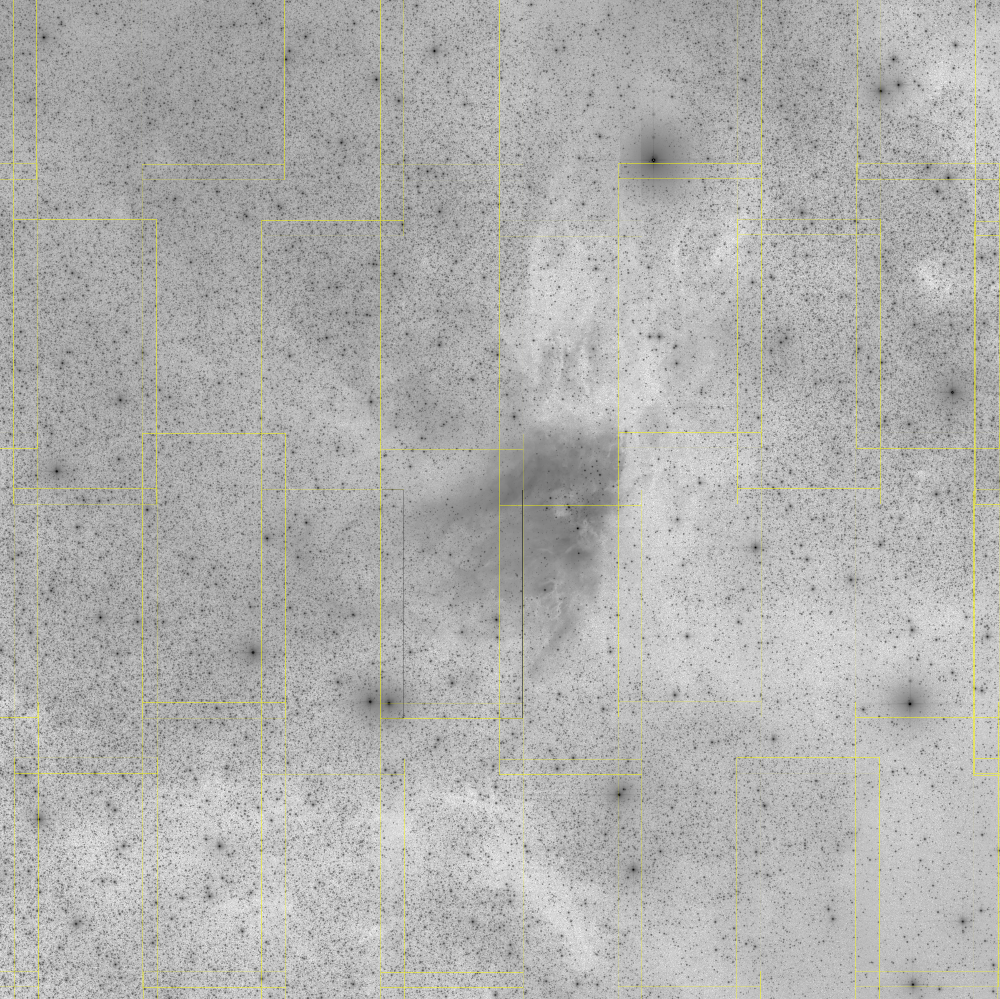

In [5]:
rtn = mViewer("-color yellow -imginfo M17/pimages.tbl \
               -color black -imginfo M17/dimages.tbl \
               -ct 1 -gray M17/mosaic.fits min max gaussian-log \
               -out work/M17/mosaic_diffexec.png",
              "", mode=2)

Image(filename='work/M17/mosaic_diffexec.png')

&nbsp;<p/>

## mDiffExec Error Handling

If mDiffExec encounters an error, the return structure will just have two elements: a status of 1 ("error") and a message string that tries to diagnose the reason for the error.

For instance, if the user specifies a table that doesn't exist: 

In [6]:
rtn = mDiffExec("M17/projected", 
                "M17/unknown.tbl", 
                "M17/M17.hdr", 
                "work/M17/diffs")
print(rtn)

{'status': '1', 'msg': b'Invalid image metadata file: M17/unknown.tbl'}


&nbsp;

## Classic Montage: mDiffExec as a Stand-Alone Program


### mDiffExec Unix/Windows Command-line Arguments

<p>mDiffExec can also be run as a command-line tool in Linux, OS X, and Windows:</p>

<p><tt>
<b>Usage:</b> mDiffExec [-p projdir] [-d] [-n(o-areas)] [-s statusfile] diffs.tbl template.hdr diffdir
</tt></p>
<p>&nbsp;</p>
<p>If you are writing in C/C++, mDiffExec can be accessed as a library function:</p>


<pre>
/*-*****************************************************************/
/*                                                                 */
/*  mDiffExec                                                      */
/*                                                                 */
/*  Read the table of overlaps found by mOverlap and rune mDiff to */
/*  generate the difference files.                                 */
/*                                                                 */
/*   char *path        Path to images to be diffed.                */
/*   char *tblfile     Table file list of images to diff.          */
/*   char *template    FITS header file used to define the desired */
/*                     output.                                     */
/*                                                                 */
/*   char *diffdir     Directory for temporary output diff files.  */
/*   int noAreas       Flag indicating there are no area images.   */
/*   int debug         Debug flag.                                 */
/*                                                                 */
/*******************************************************************/

struct mDiffExecReturn *mDiffExec(char *path, char *tblfile, char *template, char *diffdir, int noAreas, int debugin)
</pre>
<p><b>Return Structure</b></p>
<pre>
struct mDiffExecReturn
{
   int    status;        // Return status (0: OK, 1:ERROR)
   char   msg [1024];    // Return message (for error return)
   char   json[4096];    // Return parameters as JSON string
   int    count;         // Number of differences                
   int    failed;        // Number of differences that failed
   int    warning;       // Number of fits to differences that produced warnings
};
</pre>